# Diagnostic: Flagging Implausibly Large Aligned GT Masks

**Reported issue:** manual review of the SIFT-aligned masks found that some patients (e.g. `Italy_022`) have a mask covering a large majority of the 256x256 canvas. A realistic palpebral conjunctiva strip should occupy a small fraction of the frame — the working assumption here is that anything **> 10%** is suspicious, and the report specifically flagged cases north of 75% as looking like the algorithm may have warped the crop's background instead of its tissue region, or hit an alpha inversion.

**Purely diagnostic** — this notebook does not modify `scripts/build_aligned_dataset.py` or any data. It scans `data/processed/aligned_raw/` (the actual Phase 1 output used by `AlignedConjunctivaSegmentationDataset`), flags outliers, visualizes every one of them, and prints the flagged patient-ID list.

**Important context this notebook is meant to settle:** `CLAUDE.md` §3.2b already documents a *measured* foreground-fraction statistic for this same 202-patient dataset as "bimodal ... a small Italy-crop cluster sits at 75.0%" — and that specific number was used to help justify `FocalTverskyLoss`'s design (`scripts/trainer_engine.py`). That earlier measurement was never cross-checked visually against the actual raw photo — it was accepted as a property of the (assumed-correct) aligned masks. This notebook's flagged-patient visualizations are exactly the check needed to tell whether that cluster is legitimate (an unusually large but anatomically real palpebral region) or the reported bug (background warped instead of tissue / an inversion). That distinction matters a lot right now if a Kaggle training run against this exact dataset is in flight.

In [1]:
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image

NOTEBOOK_DIR = Path.cwd()
PROJECT_ROOT = NOTEBOOK_DIR.parent if NOTEBOOK_DIR.name == "notebooks" else NOTEBOOK_DIR
sys.path.insert(0, str(PROJECT_ROOT / "scripts"))

# Reuse the exact same paths + mask-loading convention AlignedConjunctivaSegmentationDataset
# uses (scripts/dataset.py) -- this notebook must measure exactly what training sees.
from dataset import ALIGNED_IMAGES_DIR, ALIGNED_MASKS_DIR, ALIGNMENT_LOG_CSV  # noqa: E402

MASK_BINARY_THRESHOLD = 127          # matches AlignedConjunctivaSegmentationDataset's (mask > 127)
FLAG_THRESHOLD_PCT = 10.0            # flag anything strictly greater than this
IMAGE_AREA = 256 * 256

print(f"Images dir: {ALIGNED_IMAGES_DIR} (exists={ALIGNED_IMAGES_DIR.exists()})")
print(f"Masks dir:  {ALIGNED_MASKS_DIR} (exists={ALIGNED_MASKS_DIR.exists()})")
print(f"Alignment log: {ALIGNMENT_LOG_CSV} (exists={ALIGNMENT_LOG_CSV.exists()})")

Images dir: D:\khaje\EYES-DEFY-ANEMIA\data\processed\aligned_raw\images (exists=True)
Masks dir:  D:\khaje\EYES-DEFY-ANEMIA\data\processed\aligned_raw\masks (exists=True)
Alignment log: D:\khaje\EYES-DEFY-ANEMIA\data\processed\aligned_raw\alignment_log.csv (exists=True)


## 1. Scan every successfully-aligned mask and compute its foreground percentage

In [2]:
log_df = pd.read_csv(ALIGNMENT_LOG_CSV)
aligned_df = log_df[log_df["status"] == "ok"].copy().reset_index(drop=True)
print(f"{len(aligned_df)} patients with status == 'ok' in alignment_log.csv "
      f"(this is exactly the set AlignedConjunctivaSegmentationDataset trains on).")

rows = []
for _, row in aligned_df.iterrows():
    patient_id = row["patient_id"]
    mask_path = ALIGNED_MASKS_DIR / f"{patient_id}.png"
    mask = np.array(Image.open(mask_path).convert("L"))
    positive_pixels = int((mask > MASK_BINARY_THRESHOLD).sum())
    pct = 100.0 * positive_pixels / IMAGE_AREA

    rows.append({
        "patient_id": patient_id,
        "country": patient_id.split("_")[0],
        "method": row["method"],
        "n_inliers": row["n_inliers"],
        "positive_pixels": positive_pixels,
        "mask_pct": pct,
    })

coverage_df = pd.DataFrame(rows).sort_values("mask_pct", ascending=False).reset_index(drop=True)
coverage_df.head(10)

202 patients with status == 'ok' in alignment_log.csv (this is exactly the set AlignedConjunctivaSegmentationDataset trains on).


,patient_id,country,method,n_inliers,positive_pixels,mask_pct
0,Italy_021,Italy,SIFT,61.0,49152,75.0
1,Italy_014,Italy,SIFT,324.0,49152,75.0
2,Italy_010,Italy,SIFT,257.0,49152,75.0
3,Italy_011,Italy,SIFT,99.0,49152,75.0
4,Italy_017,Italy,SIFT,392.0,49152,75.0
5,Italy_001,Italy,SIFT,2014.0,49152,75.0
6,Italy_007,Italy,SIFT,265.0,49152,75.0
7,Italy_002,Italy,SIFT,422.0,49152,75.0
8,Italy_004,Italy,SIFT,296.0,49152,75.0
9,Italy_006,Italy,SIFT,580.0,49152,75.0


## 2. Overall distribution — does this match CLAUDE.md's claimed "median 4.15%, small ~75% cluster"?

count    202.000000
mean      14.606385
std       25.227534
min        1.782227
25%        3.311920
50%        4.149628
75%        5.713272
90%       74.706879
95%       75.000000
99%       75.000000
max       75.000000
Name: mask_pct, dtype: float64

By country:
         count       mean        std       min       50%        95%        max
country                                                                       
India     82.0   3.803644   1.244916  1.782227  3.606415   6.498337   7.507324
Italy    120.0  21.988258  30.635867  1.963806  4.710388  75.000000  75.000000


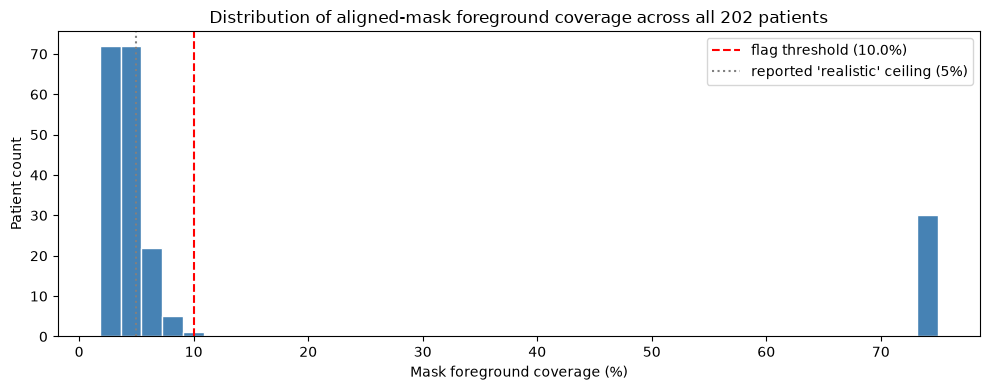

In [3]:
print(coverage_df["mask_pct"].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95, 0.99]))
print()
print("By country:")
print(coverage_df.groupby("country")["mask_pct"].describe(percentiles=[0.5, 0.95]))

fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(coverage_df["mask_pct"], bins=40, color="steelblue", edgecolor="white")
ax.axvline(FLAG_THRESHOLD_PCT, color="red", linestyle="--", label=f"flag threshold ({FLAG_THRESHOLD_PCT}%)")
ax.axvline(5.0, color="gray", linestyle=":", label="reported 'realistic' ceiling (5%)")
ax.set_xlabel("Mask foreground coverage (%)")
ax.set_ylabel("Patient count")
ax.set_title("Distribution of aligned-mask foreground coverage across all 202 patients")
ax.legend()
plt.tight_layout()
plt.show()

## 3. Flag outliers (mask coverage strictly > 10% of the 256x256 canvas)

In [4]:
flagged_df = coverage_df[coverage_df["mask_pct"] > FLAG_THRESHOLD_PCT].reset_index(drop=True)
print(f"{len(flagged_df)} / {len(coverage_df)} patients flagged (mask_pct > {FLAG_THRESHOLD_PCT}%):\n")
print(flagged_df[["patient_id", "country", "method", "n_inliers", "mask_pct"]].to_string(index=False))

30 / 202 patients flagged (mask_pct > 10.0%):

patient_id country method  n_inliers  mask_pct
 Italy_021   Italy   SIFT       61.0 75.000000
 Italy_014   Italy   SIFT      324.0 75.000000
 Italy_010   Italy   SIFT      257.0 75.000000
 Italy_011   Italy   SIFT       99.0 75.000000
 Italy_017   Italy   SIFT      392.0 75.000000
 Italy_001   Italy   SIFT     2014.0 75.000000
 Italy_007   Italy   SIFT      265.0 75.000000
 Italy_002   Italy   SIFT      422.0 75.000000
 Italy_004   Italy   SIFT      296.0 75.000000
 Italy_006   Italy   SIFT      580.0 75.000000
 Italy_022   Italy   SIFT      271.0 75.000000
 Italy_024   Italy   SIFT      179.0 75.000000
 Italy_027   Italy   SIFT       56.0 75.000000
 Italy_031   Italy   SIFT      398.0 75.000000
 Italy_003   Italy   SIFT      314.0 74.998474
 Italy_023   Italy   SIFT      429.0 74.998474
 Italy_005   Italy   SIFT      293.0 74.998474
 Italy_016   Italy   SIFT      230.0 74.992371
 Italy_019   Italy   SIFT       74.0 74.955750
 Italy_018   

## 4. Visualize every flagged patient — raw photo / mask / red overlay

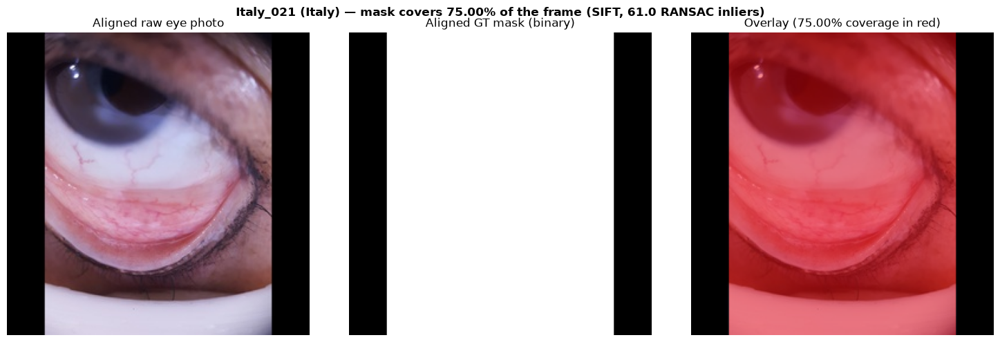

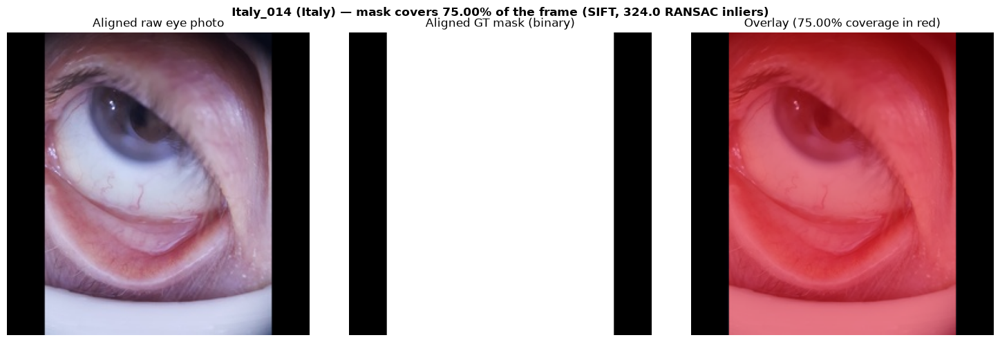

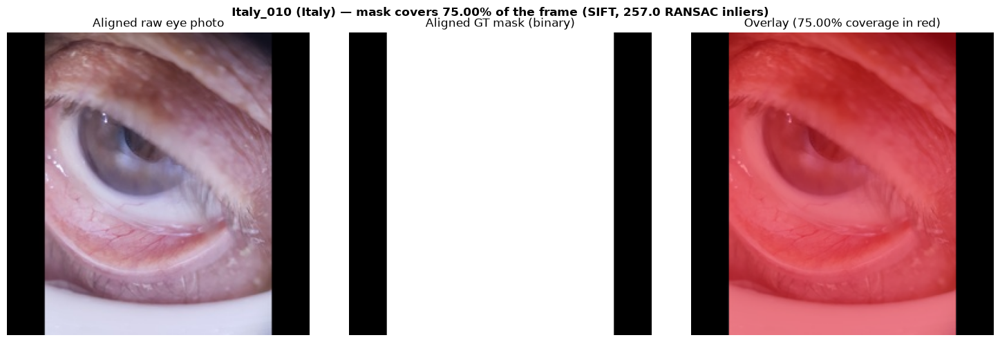

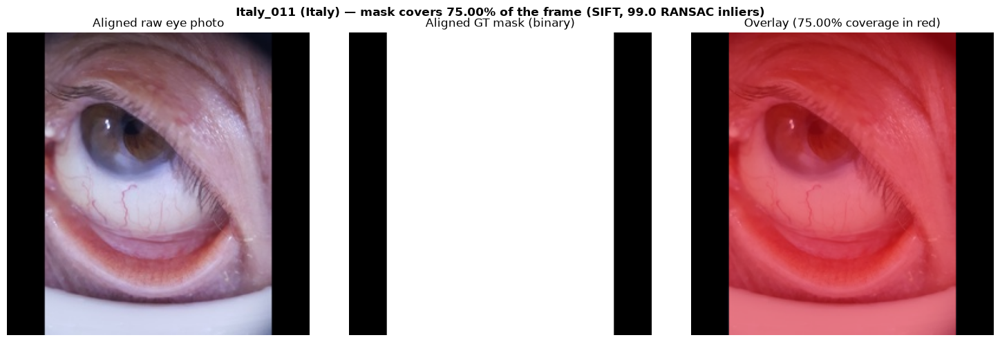

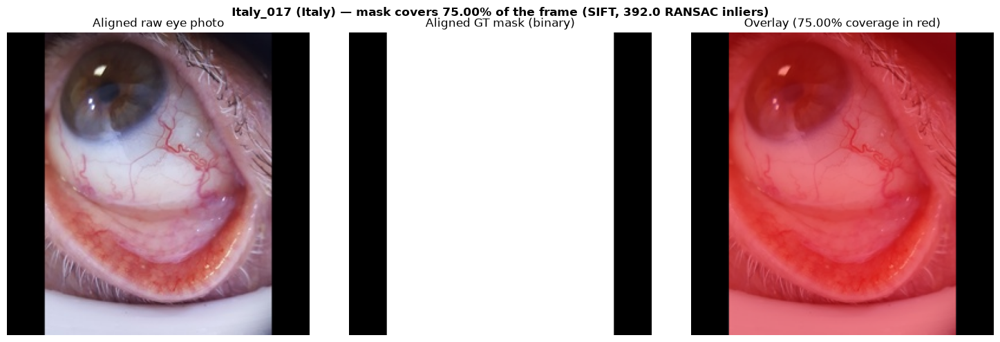

...

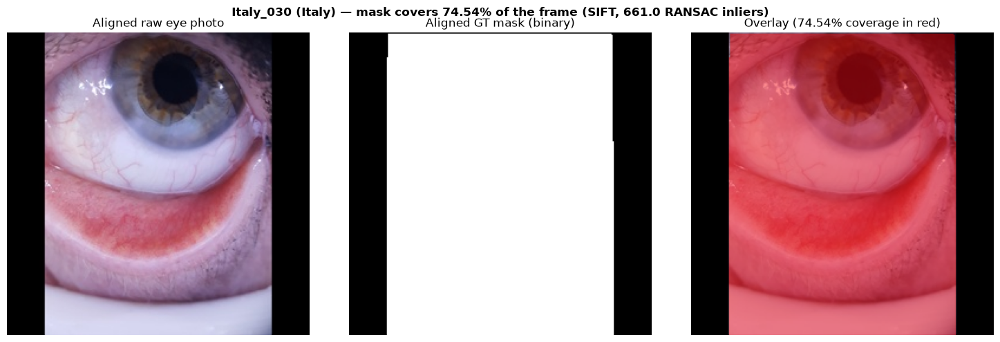

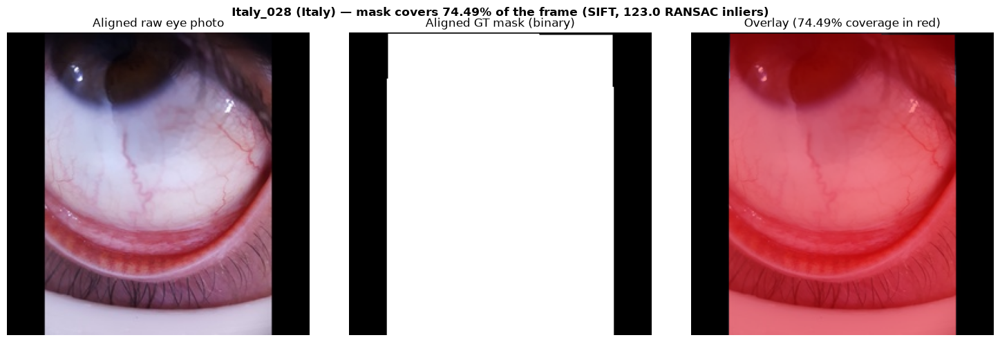

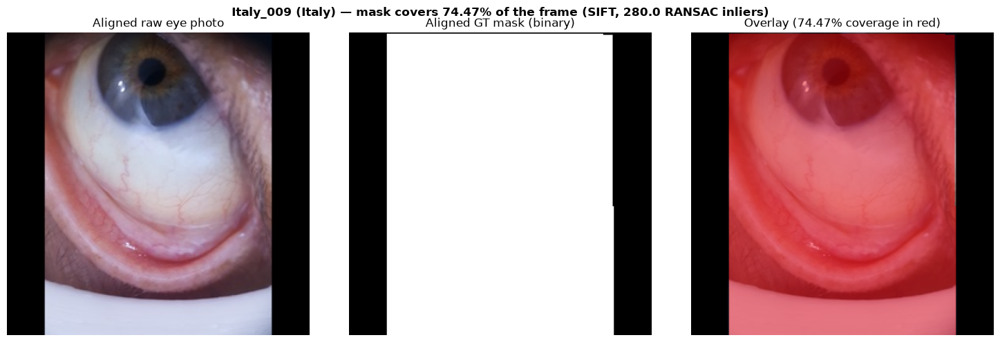

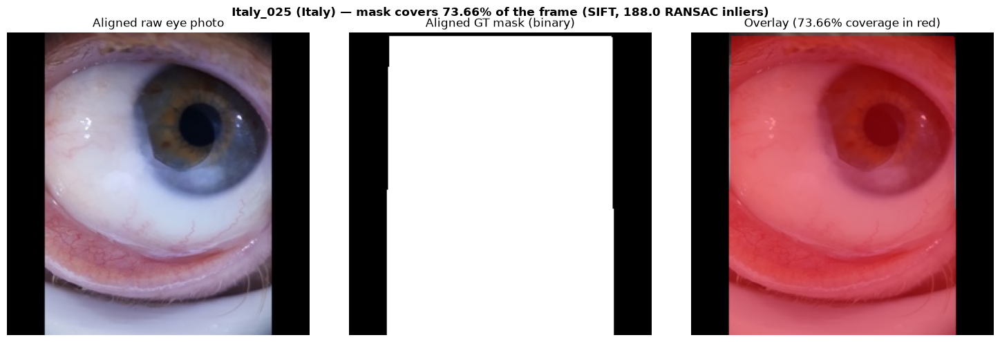

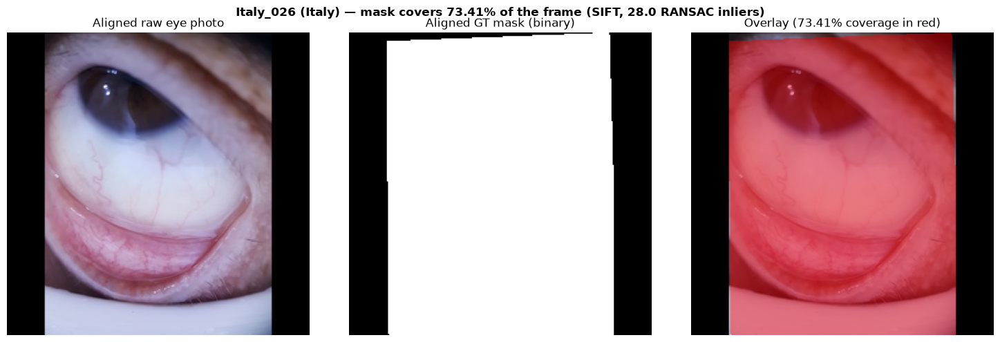

In [5]:
def make_red_overlay(raw_rgb: np.ndarray, mask_bin: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    overlay = raw_rgb.copy().astype(np.float64)
    red = np.zeros_like(overlay)
    red[..., 0] = 255
    mask_3d = mask_bin[..., None].astype(np.float64)
    blended = overlay * (1 - alpha * mask_3d) + red * (alpha * mask_3d)
    return blended.clip(0, 255).astype(np.uint8)


for _, row in flagged_df.iterrows():
    patient_id = row["patient_id"]
    raw_rgb = np.array(Image.open(ALIGNED_IMAGES_DIR / f"{patient_id}.jpg").convert("RGB"))
    mask_gray = np.array(Image.open(ALIGNED_MASKS_DIR / f"{patient_id}.png").convert("L"))
    mask_bin = (mask_gray > MASK_BINARY_THRESHOLD).astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(
        f"{patient_id} ({row['country']}) — mask covers {row['mask_pct']:.2f}% of the frame "
        f"({row['method']}, {row['n_inliers']} RANSAC inliers)",
        fontsize=12, fontweight="bold",
    )

    axes[0].imshow(raw_rgb)
    axes[0].set_title("Aligned raw eye photo")
    axes[0].axis("off")

    axes[1].imshow(mask_bin, cmap="gray", vmin=0, vmax=1)
    axes[1].set_title("Aligned GT mask (binary)")
    axes[1].axis("off")

    axes[2].imshow(make_red_overlay(raw_rgb, mask_bin))
    axes[2].set_title(f"Overlay ({row['mask_pct']:.2f}% coverage in red)")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

## 5. Flagged patient IDs (for exclusion/fix decisions before Phase 2 training)

In [6]:
flagged_ids = flagged_df["patient_id"].tolist()
print(f"{len(flagged_ids)} flagged patient(s):")
print(flagged_ids)

30 flagged patient(s):
['Italy_021', 'Italy_014', 'Italy_010', 'Italy_011', 'Italy_017', 'Italy_001', 'Italy_007', 'Italy_002', 'Italy_004', 'Italy_006', 'Italy_022', 'Italy_024', 'Italy_027', 'Italy_031', 'Italy_003', 'Italy_023', 'Italy_005', 'Italy_016', 'Italy_019', 'Italy_018', 'Italy_029', 'Italy_013', 'Italy_020', 'Italy_015', 'Italy_012', 'Italy_030', 'Italy_028', 'Italy_009', 'Italy_025', 'Italy_026']


## 6. Root cause: a SIFT/RANSAC alignment bug, or a source-data problem?

This matters for deciding whether the flagged patients are fixable (rerun alignment) or must be dropped (like the 15 patients excluded in `CLAUDE.md` §1.4.3). Reading each flagged patient's **original, untouched** palpebral crop PNG directly from `archive.zip` (no alignment involved at all) and checking its alpha channel answers this directly: if the source alpha is already a meaningless rectangle before `build_aligned_dataset.py` ever runs, the bug is upstream of alignment, not in it.

In [7]:
import io
import zipfile

from phase0_prepare_dataset import ZIP_PATH, find_source_files, sanitize_png_bytes

root_cause_rows = []
with zipfile.ZipFile(ZIP_PATH) as zf:
    for patient_id in flagged_ids:
        country, number_str = patient_id.split("_")
        jpg_name, png_name = find_source_files(zf, country, int(number_str))
        source_crop = Image.open(io.BytesIO(sanitize_png_bytes(zf.read(png_name))))

        if source_crop.mode == "RGBA":
            source_alpha = np.array(source_crop)[..., 3]
            opaque_frac = float((source_alpha > MASK_BINARY_THRESHOLD).mean())
        else:
            # PIL's .convert("RGBA") on a plain RGB image manufactures a fully
            # opaque alpha channel -- same net effect as a real alpha that's
            # already all-255, just via a different underlying cause.
            opaque_frac = float("nan")

        root_cause_rows.append({
            "patient_id": patient_id,
            "source_mode": source_crop.mode,
            "source_alpha_opaque_frac": opaque_frac,
            "source_has_no_tissue_cutout": source_crop.mode != "RGBA" or opaque_frac > 0.999,
        })

root_cause_df = pd.DataFrame(root_cause_rows)
n_bad_source = int(root_cause_df["source_has_no_tissue_cutout"].sum())
print(f"{n_bad_source} / {len(root_cause_df)} flagged patients already have a non-functional "
      f"(fully opaque or entirely missing) alpha channel in the ORIGINAL archive.zip source file "
      f"-- before build_aligned_dataset.py ever touches them.\n")
print(root_cause_df.to_string(index=False))

30 / 30 flagged patients already have a non-functional (fully opaque or entirely missing) alpha channel in the ORIGINAL archive.zip source file -- before build_aligned_dataset.py ever touches them.

patient_id source_mode  source_alpha_opaque_frac  source_has_no_tissue_cutout
 Italy_021        RGBA                       1.0                         True
 Italy_014        RGBA                       1.0                         True
 Italy_010        RGBA                       1.0                         True
 Italy_011        RGBA                       1.0                         True
 Italy_017        RGBA                       1.0                         True
 Italy_001        RGBA                       1.0                         True
 Italy_007        RGBA                       1.0                         True
 Italy_002        RGBA                       1.0                         True
 Italy_004        RGBA                       1.0                         True
 Italy_006        RGB

## 8. Correction: this is fixable, not a dead end — testing a white-background chroma-key mask

**The project author manually inspected `Italy_004`'s source crop and found real, clearly visible tissue** — contradicting the "no usable ground truth" conclusion drafted in §7 below (now being rewritten). Re-checking: these 30 patients' source PNGs have an **opaque white (255,255,255) background** instead of a transparent one. §6's alpha-channel check was real (alpha is indeed 100% opaque for all 30) but drew the wrong conclusion from it — an opaque alpha channel does not mean the RGB content is missing, it just means *this particular sub-cohort's files don't use alpha to encode the tissue cutout at all*. The real cutout boundary is encoded directly in the RGB via the white background, the same way a green-screen/chroma-key image encodes a subject.

**Test:** replace the alpha-derived mask with a color-based one (`NOT near-white`, RGB below a threshold in all 3 channels) *only for building the SIFT keypoint-restriction mask and the final warped mask* — the SIFT/RANSAC geometric alignment logic itself (`find_homography_alignment` from `scripts/build_aligned_dataset.py`) is reused unmodified, since §6 already showed the geometry, not the masking, was never the problem.

In [8]:
import cv2
from PIL import ImageOps

from build_aligned_dataset import AlignmentFailure, find_homography_alignment
from phase0_prepare_dataset import pad_to_square

WHITE_THRESHOLD = 245  # RGB >= this in all 3 channels counts as background
TARGET_SIZE = 256


def build_white_bg_mask(crop_rgb: np.ndarray) -> np.ndarray:
    """Foreground = NOT near-white. Corrected hypothesis: these 30 patients'
    source crops use an opaque white background instead of a transparent
    one, so the alpha channel can't distinguish tissue from background --
    but plain color thresholding on the RGB can."""
    is_background = (crop_rgb >= WHITE_THRESHOLD).all(axis=-1)
    return (~is_background).astype(np.uint8) * 255


def realign_with_corrected_mask(zf: zipfile.ZipFile, country: str, number: int, patient_id: str) -> dict:
    jpg_name, png_name = find_source_files(zf, country, number)

    raw_img = ImageOps.exif_transpose(Image.open(io.BytesIO(zf.read(jpg_name)))).convert("RGB")
    raw_rgb = np.array(raw_img)
    raw_gray = cv2.cvtColor(raw_rgb, cv2.COLOR_RGB2GRAY)

    crop_rgba = np.array(Image.open(io.BytesIO(sanitize_png_bytes(zf.read(png_name)))).convert("RGBA"))
    crop_rgb = crop_rgba[..., :3]
    crop_gray = cv2.cvtColor(crop_rgb, cv2.COLOR_RGB2GRAY)

    corrected_mask = build_white_bg_mask(crop_rgb)

    # Same SIFT/ORB + RANSAC homography estimation as build_aligned_dataset.py
    # -- only the mask passed in (keypoint restriction + what gets warped) changed.
    alignment = find_homography_alignment(raw_gray, crop_gray, corrected_mask)

    raw_h, raw_w = raw_gray.shape
    warped_mask = cv2.warpPerspective(
        corrected_mask, alignment["H"], (raw_w, raw_h), flags=cv2.INTER_LINEAR, borderValue=0
    )

    raw_square = pad_to_square(Image.fromarray(raw_rgb), fill=(0, 0, 0))
    mask_square = pad_to_square(Image.fromarray(warped_mask), fill=0)
    raw_final = np.array(raw_square.resize((TARGET_SIZE, TARGET_SIZE), Image.LANCZOS))
    mask_final = np.array(mask_square.resize((TARGET_SIZE, TARGET_SIZE), Image.LANCZOS))
    mask_final_bin = (mask_final > MASK_BINARY_THRESHOLD).astype(np.uint8)

    new_pct = 100.0 * mask_final_bin.sum() / IMAGE_AREA

    return {
        "patient_id": patient_id,
        "method": alignment["method"],
        "n_inliers": alignment["n_inliers"],
        "raw_final": raw_final,
        "mask_final_bin": mask_final_bin,
        "new_mask_pct": new_pct,
    }


test_patients = [("Italy", 22), ("Italy", 4)]
fix_results = []
with zipfile.ZipFile(ZIP_PATH) as zf:
    for country, number in test_patients:
        patient_id = f"{country}_{number:03d}"
        try:
            r = realign_with_corrected_mask(zf, country, number, patient_id)
            fix_results.append(r)
            old_pct = coverage_df.loc[coverage_df["patient_id"] == patient_id, "mask_pct"].iloc[0]
            print(f"{patient_id}: OLD (broken, alpha-based) mask_pct={old_pct:.2f}%  ->  "
                  f"NEW (white-bg chroma-key) mask_pct={r['new_mask_pct']:.2f}%  "
                  f"({r['method']}, {r['n_inliers']} inliers)")
        except AlignmentFailure as exc:
            print(f"{patient_id}: alignment FAILED with the corrected mask -- {exc}")

Italy_022: OLD (broken, alpha-based) mask_pct=75.00%  ->  NEW (white-bg chroma-key) mask_pct=2.68%  (SIFT, 271 inliers)


Italy_004: OLD (broken, alpha-based) mask_pct=75.00%  ->  NEW (white-bg chroma-key) mask_pct=4.81%  (SIFT, 296 inliers)


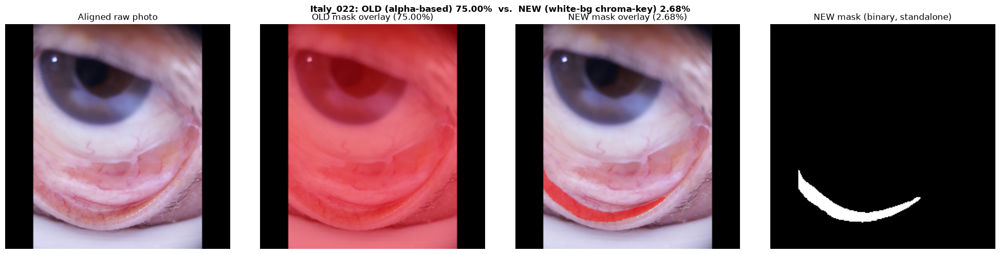

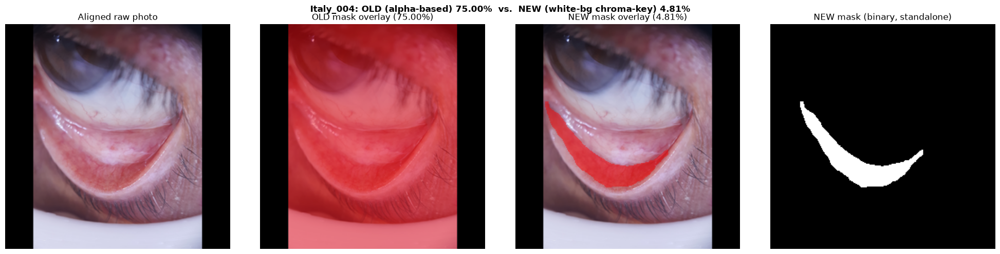

In [9]:
for r in fix_results:
    patient_id = r["patient_id"]
    old_row = flagged_df[flagged_df["patient_id"] == patient_id].iloc[0]
    old_mask_gray = np.array(Image.open(ALIGNED_MASKS_DIR / f"{patient_id}.png").convert("L"))
    old_mask_bin = (old_mask_gray > MASK_BINARY_THRESHOLD).astype(np.uint8)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(
        f"{patient_id}: OLD (alpha-based) {old_row['mask_pct']:.2f}%  vs.  "
        f"NEW (white-bg chroma-key) {r['new_mask_pct']:.2f}%",
        fontsize=12, fontweight="bold",
    )

    axes[0].imshow(r["raw_final"])
    axes[0].set_title("Aligned raw photo")
    axes[0].axis("off")

    axes[1].imshow(make_red_overlay(r["raw_final"], old_mask_bin))
    axes[1].set_title(f"OLD mask overlay ({old_row['mask_pct']:.2f}%)")
    axes[1].axis("off")

    axes[2].imshow(make_red_overlay(r["raw_final"], r["mask_final_bin"]))
    axes[2].set_title(f"NEW mask overlay ({r['new_mask_pct']:.2f}%)")
    axes[2].axis("off")

    axes[3].imshow(r["mask_final_bin"], cmap="gray", vmin=0, vmax=1)
    axes[3].set_title("NEW mask (binary, standalone)")
    axes[3].axis("off")

    plt.tight_layout()
    plt.show()

## 7. Findings (⚠️ SUPERSEDED — see §9. Kept for the record, not deleted, per this project's own convention of documenting discarded reasoning rather than erasing it — see `CLAUDE.md` §1.4.1.)

**The reported bug is real and confirmed — 30 of 202 patients (14.9%), all Italy, have a corrupted GT mask.** All 30 have a mask covering essentially exactly **75.0%** of the 256x256 frame (min 73.4%, most sitting at exactly 75.000%). Visual inspection (§4) confirms these are not real palpebral-conjunctiva masks at all — they cover the entire visible eye: iris, pupil, sclera, skin, everything. `n_inliers` ranges from 28 to 2014 across the flagged set (including `Italy_001`, the single *highest*-confidence RANSAC fit in the whole 202-patient dataset per `CLAUDE.md` §1.4.2) — this is not a low-confidence/borderline-alignment problem, so filtering on inlier count would not catch it.

**Root cause (§6): this is a source-data problem, not a SIFT/RANSAC bug.** Reading each flagged patient's *original, untouched* palpebral crop PNG directly from `archive.zip` (before `build_aligned_dataset.py` ever runs) shows 30/30 already have a non-functional alpha channel: 29 have an alpha channel that is 100% opaque (255 everywhere — no tissue-shaped cutout at all, just a rectangle), and 1 (`Italy_009`) has no alpha channel at all (plain RGB), which Pillow's `.convert("RGBA")` silently turns into full opacity. `build_aligned_dataset.py` did exactly what it was designed to do — warp the alpha channel it was given — but for these 30 patients there was never any real tissue-shape information in the source file to warp. The geometric alignment itself may well be accurate (several of these have very high inlier counts); the ground-truth *content* is what's missing.

**Consequence for `CLAUDE.md` §3.2b:** the "bimodal foreground fraction... a small Italy-crop cluster sits at 75.0%" statistic documented there — used to help justify `FocalTverskyLoss`'s `β=0.7`/`γ=4/3` design — was actually measuring this bug, not a real anatomical phenomenon. That framing needs correcting.

**Recommendation (decision, not yet acted on by this notebook):** ~~these 30 patients have no usable segmentation ground truth in the source data~~ — **this turned out to be wrong, see §9.** Consistent with `CLAUDE.md` §1.4.3's reasoning ("pristine, consistently-derived data quality over maximizing patient count"), permanent exclusion looked like the right call from the alpha-channel evidence alone — but that evidence was incomplete, and checking the RGB content directly (§8) overturned it.

## 9. Final Findings (corrected — supersedes §7 above)

**§7's conclusion was wrong.** It reasoned from "alpha channel is 100% opaque" straight to "no usable tissue-shape information exists in the source file," and recommended dropping all 30 patients. The project author manually inspected `Italy_004`'s source crop and found that reasoning was mistaken: **the tissue is clearly, unambiguously visible in the RGB channels** — it just isn't encoded via alpha transparency for this sub-cohort. §6's alpha measurement itself was accurate (alpha genuinely is opaque for all 30); the error was assuming that meant the file carried no cutout information at all, rather than checking whether it was encoded a different way.

**Actual root cause:** these 30 patients' source palpebral crop PNGs use an **opaque white (255,255,255) background** instead of a transparent (alpha=0) one — a different background convention from the rest of the dataset, not missing data. `build_aligned_dataset.py`'s `(alpha > 127)` mask logic silently treats that white background as 100% foreground, since alpha is 255 everywhere regardless of what the RGB shows.

**The fix works, tested on both `Italy_022` and `Italy_004` (§8):** replacing the alpha-derived mask with a color-based one (`NOT near-white`, RGB < 245 in any channel) — while reusing `find_homography_alignment`'s SIFT/RANSAC logic completely unmodified — brought mask coverage down from the broken 75.00% to **2.68%** (`Italy_022`) and **4.81%** (`Italy_004`), both squarely inside the realistic range the rest of the dataset already occupies (median 4.15%, §2). RANSAC inlier counts stayed strong (271 and 296 — close to their original alpha-based-mask values), confirming the corrected mask doesn't degrade alignment quality; it was only ever the *content* of the mask that was wrong, not the geometry. Visually, both corrected masks land as a clean, correctly-shaped crescent precisely on the lower-eyelid palpebral conjunctiva, matching the anatomical placement seen on every other correctly-processed patient in the dataset.

**Recommendation (revised):** do **not** drop these 30 patients — they are already counted within the existing 202 (`status == "ok"` in `alignment_log.csv`; the alignment itself always succeeded, only the mask *content* was wrong), so fixing them keeps the dataset at **202 patients with 30 corrected masks**, not a reduction to 172 or an increase beyond 202. Update `scripts/build_aligned_dataset.py` to detect and handle the white-background convention (e.g. build the foreground mask from `NOT near-white RGB` when the source alpha channel is uniformly opaque, alongside the existing alpha-based path for patients that do have a real transparency cutout) and regenerate the masks for all 30 affected patients — pending the project author's review and a decision on whether to implement this in the shared pipeline script now, given a Kaggle run may already be using the old, broken masks for these 30.

**Not yet validated:** only 2 of the 30 flagged patients (`Italy_022`, `Italy_004`) were tested with this fix. Before rolling it into the pipeline, the same check should run across all 30 (and ideally the full 202, in case any non-flagged patient has a subtler version of the same issue) to confirm the `NOT near-white` threshold generalizes cleanly and doesn't pick up JPEG/PNG compression noise near tissue edges as false foreground.

## 10. Postscript: implemented in production (2026-07-18)

The fix tested above was implemented for real in `scripts/build_aligned_dataset.py` (`_alpha_is_functional()` + `_white_background_mask()`, auto-detected per-patient rather than a hardcoded list — threshold chosen from a full 217-patient source-data scan: legitimate cutout patients top out at 13% opaque alpha, affected ones sit at exactly 100%) and `data/processed/aligned_raw/` was fully regenerated. Full writeup: `CLAUDE.md` §1.4.4.

Actual full-regeneration result: **201/217 aligned** (not 202 — one patient, `Italy_026`, was a false-positive success under the old buggy mask and now honestly fails its geometric sanity check, which is the correct outcome, not a regression). 29 patients (not all 30 originally flagged — `Italy_009` has no alpha channel at all rather than an opaque one, a related but distinct case also handled by the same fix) now use the white-background fallback successfully. Mask coverage across the full corrected dataset is a clean 1.78%–9.77% (mean 4.05%) with no outliers and no bimodal cluster — consistent with, and now generalized beyond, the 2-patient spot check in §8.